# Capstone Project

In [13]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [22]:
# Importing Libraries
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from urllib.request import urlopen
from bs4 import BeautifulSoup

from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from tqdm import tqdm
tqdm.pandas()

import requests
import folium
from folium.plugins import HeatMap

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

from sklearn.cluster import KMeans


C:\Users\alecl\Anaconda3\lib\site-packages\tqdm\std.py:699: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
# Step 1: Importing data

borough = pd.read_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\borough.csv')

Getting data via Geopy

In [3]:
address = 'Waterloo region, Canada'
geolocator = Nominatim(user_agent = "https://www.google.com/maps/place/43%C2%B028'00.5%22N+80%C2%B030'59.0%22W/@43.4668,-80.51639,320071m/data=!3m1!1e3!4m5!3m4!1s0x0:0x0!8m2!3d43.4668!4d-80.51639?hl=en")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of the Waterloo Region are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of the Waterloo Region are 43.4586422, -80.5194113.


In [4]:
borough['address'] = borough['Neighborhood'] + ',' + borough['Borough'] + ',' + borough['Province'] + ',' + borough['Country']  

In [5]:
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
borough['location'] = borough['address'].progress_apply(geocode) # As above but shows progress bar
borough['latlong'] = borough['location'].apply(lambda x: tuple(x.point) if x else None)

100%|██████████| 66/66 [01:05<00:00,  1.00it/s]


In [6]:
borough

,Neighborhood,Borough,Province,Country,Post,address,location,latlong
0,Centreville Chicopee,Kitchener,Ontario,Canada,N2A,"Centreville Chicopee,Kitchener ,Ontario,Canada","(Centreville-Chicopee Community Centre, Ice Ri...","(43.42857625, -80.42981433532395, 0.0)"
1,Grand River South,Kitchener,Ontario,Canada,N2A,"Grand River South,Kitchener ,Ontario,Canada","(Grand River, Doon, Kitchener, Region of Water...","(43.442028699999995, -80.40306964845313, 0.0)"
2,Heritage Park,Kitchener,Ontario,Canada,N2A,"Heritage Park,Kitchener ,Ontario,Canada","(Heritage Park, Kitchener, Region of Waterloo,...","(43.463895449999995, -80.44733235883945, 0.0)"
3,Idlewood,Kitchener,Ontario,Canada,N2A,"Idlewood,Kitchener ,Ontario,Canada","(Idlewood, Kitchener, Region of Waterloo, Sout...","(43.4481839, -80.4304161, 0.0)"
4,Stanley Park,Kitchener,Ontario,Canada,N2A,"Stanley Park,Kitchener ,Ontario,Canada","(Stanley Park, Kitchener, Region of Waterloo, ...","(43.446187, -80.4456112, 0.0)"
5,Grand River North,Kitchener,Ontario,Canada,N2B,"Grand River North,Kitchener ,Ontario,Canada","(Grand River, Doon, Kitchener, Region of Water...","(43.442028699999995, -80.40306964845313, 0.0)"
6,Rosemount,Kitchener,Ontario,Canada,N2B,"Rosemount,Kitchener ,Ontario,Canada","(Rosemount, Kitchener, Region of Waterloo, Sou...","(43.4582875, -80.4612751, 0.0)"
7,Victoria North,Kitchener,Ontario,Canada,N2B,"Victoria North,Kitchener ,Ontario,Canada","(RBC, Ontario Street North, Downtown, Kitchene...","(43.4515356, -80.4891511, 0.0)"
8,Alpine,Kitchener,Ontario,Canada,N2C,"Alpine,Kitchener ,Ontario,Canada","(Kitchener, Region of Waterloo, Southwestern O...","(43.451291, -80.4927815, 0.0)"
9,Country Hills East,Kitchener,Ontario,Canada,N2C,"Country Hills East,Kitchener ,Ontario,Canada","(Country Hills East, Kitchener, Region of Wate...","(43.4169416, -80.463139, 0.0)"


In [7]:
borough.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\boroughlats.csv')

Importing new file containaing all latitude and longitude coordinates of the Waterloo Region

In [45]:
df = pd.read_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\borough_cleaned.csv')

In [9]:
len(df.Neighborhood.unique())

61

### Foursquare data for each Neighborhood

The final data set to be gathered is using Foursquare to provide data for the venues in the immediate vicinity for each of the neighborhoods in the Region of Waterloo. In this section we find up 100 venues in the 1000m closest to the offices listed in the waterloo Region. The final output is a DataFrame containing these details which can then be used for clustering in the next step of data analysis (out of scope for this week's assignment.

The steps followed are the following:

1. Using the latitude and longitude found in the previous section,
2. Query Foursquare using the explore API to find up to 100 local popular venues.
3. Group the data and shape using one hot encoding.


Getting the lats and longs for waterloo region

In [10]:
# Waterloo region Latitude and Longitude 
Waterloo_region_lat = 43.4758
Waterloo_region_long = -80.5438

Inputtting credentials

In [11]:
CLIENT_ID = 'WN0P0C101J2TJCFT3PDYEO41VRW1DC23LQM5JOJ0BXFDUFOV' # your Foursquare ID
CLIENT_SECRET = '2HTDCRCPOICYN3ENPPMZXQWGE3OK32NJWYN0KDZDN5GTUHRO' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: WN0P0C101J2TJCFT3PDYEO41VRW1DC23LQM5JOJ0BXFDUFOV
CLIENT_SECRET:2HTDCRCPOICYN3ENPPMZXQWGE3OK32NJWYN0KDZDN5GTUHRO


In [12]:
# function that extracts the category of the venue

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Here I am setting the radius at 1000m. This eis because I want to get all of the venues withyin a 1km radius. Later on I will drop the dupplicate values in the venues column.

In [13]:
# function that gets nearby venues

def getNearbyVenues(names, latlong, radius=5000):
    LIMIT = 1000
    
    venues_list=[]
    for name, latlng in zip(names, latlong):
        
        if type(latlng) != tuple:  # Need this scenario when latlong is from csv and hence not a tuple!
            latlng = list(map(float,latlng.strip('()').split(',')))
        
        print(name, list(latlng)[0], list(latlng)[1])
        lat = list(latlng)[0]
        lng = list(latlng)[1]
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [14]:
df.Borough = df.Borough.str.replace(' ', '')

In [15]:
len(df['latlong'].unique())

56

Mapping the regions

In [21]:
map_Waterloo_region_size = folium.Map(location=[Waterloo_region_lat, Waterloo_region_long], zoom_start=12)

for latlng, office in zip(df['latlong'], 
                          df['Neighborhood']):
    
    if type(latlng) != tuple:  # Need this scenario when latlong is from csv and hence not a tuple!
        latlng = list(map(float,latlng.strip('()').split(',')))
    
    label = '{}'.format(office)
    label = folium.Popup(label, parse_html=True)
    if latlng != None:
            folium.Circle(
            [latlng[0], latlng[1]],
            radius=1000, # Plot circle using Circle (not CircleMarker) to show 400m radius around each Neighborhood
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(map_Waterloo_region_size)  
    
map_Waterloo_region_size

Here we see there is sigtnificant overlap in the neighborhoods using a 1 km radius.

In [17]:
Waterloo_region_venues = getNearbyVenues(names=df['address'],
                                latlong=df['latlong']
                                )
Waterloo_region_venues

Centreville Chicopee,Kitchener ,Ontario,Canada 43.4285762 -80.4298143
Grand River South,Kitchener ,Ontario,Canada 43.4420287 -80.4030696
Heritage Park,Kitchener ,Ontario,Canada 43.46389545 -80.4473323
Idlewood,Kitchener ,Ontario,Canada 43.4481839 -80.4304161
Stanley Park,Kitchener ,Ontario,Canada 43.446187 -80.4456112
Grand River North,Kitchener ,Ontario,Canada 43.4420287 -80.4030696
Rosemount,Kitchener ,Ontario,Canada 43.4582875 -80.4612751
Victoria North,Kitchener ,Ontario,Canada 43.4515356 -80.4891511
Alpine,Kitchener ,Ontario,Canada 43.451291 -80.4927815
Country Hills East,Kitchener ,Ontario,Canada 43.4169416 -80.463139
Trillium Industrial Park,Kitchener ,Ontario,Canada 43.4058 -80.4493
Vanier,Kitchener ,Ontario,Canada 43.4246395 -80.4600829
Country Hills,Kitchener,Ontario,Canada 43.4140031 -80.4730164
Country Hills West,Kitchener,Ontario,Canada 43.4098067 -80.4881723
Laurentian Hills,Kitchener,Ontario,Canada 43.4199304 -80.4988723
Laurentian West,Kitchener,Ontario,Canada 43.435557

KeyError: 'groups'

In [18]:
len(Waterloo_region_venues['Venue Latitude'].unique())

NameError: name 'Waterloo_region_venues' is not defined

In [54]:
Waterloo_region_venues

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Centreville Chicopee,43.428576,-80.429814,Martini's restaurant,43.428779,-80.432767,American Restaurant
1,Centreville Chicopee,43.428576,-80.429814,The Bent Elbow,43.430146,-80.436878,Gastropub
2,Centreville Chicopee,43.428576,-80.429814,Robert's Boxed Meats,43.428291,-80.421474,Food & Drink Shop
3,Centreville Chicopee,43.428576,-80.429814,Bangkok Cuisine,43.431065,-80.437437,Thai Restaurant
4,Centreville Chicopee,43.428576,-80.429814,Chicopee Ski & Summer Resort,43.435920,-80.418340,Ski Area
5,Centreville Chicopee,43.428576,-80.429814,Firehouse Subs,43.421662,-80.443819,Sandwich Place
6,Centreville Chicopee,43.428576,-80.429814,GoodLife Fitness Kitchener Fairway Plaza,43.419585,-80.447499,Gym
7,Centreville Chicopee,43.428576,-80.429814,Charcoal Steak House,43.428977,-80.433023,Steakhouse
8,Centreville Chicopee,43.428576,-80.429814,dels Enoteca Pizzeria,43.429069,-80.432908,Italian Restaurant
9,Centreville Chicopee,43.428576,-80.429814,Farm Boy,43.420932,-80.440689,Grocery Store


In [60]:
Waterloo_region_venues.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Waterloo_region_after_fs.csv')

PermissionError: [Errno 13] Permission denied: 'C:\\Users\\alecl\\Desktop\\Certificates\\Coursera\\Capstone\\Waterloo_region_after_fs.csv'

In [24]:
Waterloo_region_venues = pd.read_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Waterloo_region_after_fs.csv')

In [25]:
print(Waterloo_region_venues.shape)
print('There are {} unique Venue categories within this data for the Waterloo region.'.format(len(Waterloo_region_venues['Venue Category'].unique())))

(5929, 8)
There are 148 unique Venue categories within this data for the Waterloo region.


In [26]:
len(Waterloo_region_venues['Neighborhood'].unique())

61

In [27]:
Waterloo_region_venues.reset_index(inplace = True)

In [28]:
len(Waterloo_region_venues)

5929

In [29]:
Waterloo_region_venues['Venue Category'].value_counts()

Coffee Shop                        358
Café                               310
Restaurant                         254
Grocery Store                      202
Liquor Store                       165
Italian Restaurant                 162
Sandwich Place                     160
Gym                                140
Pizza Place                        136
Middle Eastern Restaurant          134
Bakery                             130
American Restaurant                126
Pub                                110
Indian Restaurant                  109
Park                               104
Gastropub                          101
Vegetarian / Vegan Restaurant       81
Ice Cream Shop                      80
Food & Drink Shop                   74
Pet Store                           73
Diner                               71
Burger Joint                        70
Thai Restaurant                     68
Furniture / Home Store              67
Bank                                67
Breakfast Spot           

In [30]:
# Dropping duplicates caused by overlaping boundaries
Waterloo_region_venues.columns = Waterloo_region_venues.columns.str.replace(" ", "_")
Waterloo_region_venues = Waterloo_region_venues.drop_duplicates(subset=["Venue_Latitude","Venue_Longitude"]).reset_index(drop=True)

In [31]:
Waterloo_region_venues.Neighborhood.value_counts()

Centreville Chicopee        100
Preston Heights              51
Heritage Park                50
Victoria North               42
Lang's Farm                  39
Pioneer Tower East           37
Christopher-Champlain        33
Trussler                     24
Forest Hill                  24
Doon South                   22
Rosemount                    20
Northward                    18
East Galt                    18
Laurentian Hills             18
Trillium Industrial Park     16
Country Hills East           14
Laurelwood                   12
Laurentian West              12
Country Hills West           11
Grand River South            11
KW Hospital                  11
South Plains                 10
Vanier                       10
Idlewood                      8
Alpine                        7
Country Hills                 6
Brigadoon                     6
Stanley Park                  5
East Hespeler                 5
Forest Heights                5
Cherry Hill                   4
Bridgepo

In [32]:
Waterloo_region_venues.groupby('Neighborhood').count()

,index,Unnamed:_0,Neighborhood_Latitude,Neighborhood_Longitude,Venue,Venue_Latitude,Venue_Longitude,Venue_Category
Neighborhood,,,,,,,,
Alpine,7,7,7,7,7,7,7,7
Beechwood,2,2,2,2,2,2,2,2
Bridgeport East,2,2,2,2,2,2,2,2
Brigadoon,6,6,6,6,6,6,6,6
Centreville Chicopee,100,100,100,100,100,100,100,100
Cherry Hill,4,4,4,4,4,4,4,4
Christopher-Champlain,33,33,33,33,33,33,33,33
Country Hills,6,6,6,6,6,6,6,6
Country Hills East,14,14,14,14,14,14,14,14


In [33]:
len(Waterloo_region_venues)

655

In [34]:
# one hot encoding
Waterloo_region_onehot = pd.get_dummies(Waterloo_region_venues[['Venue_Category']], prefix="", prefix_sep="")

# add neighborhood name column back to dataframe
Waterloo_region_onehot['Neighborhood'] = Waterloo_region_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [Waterloo_region_onehot.columns[-1]] + list(Waterloo_region_onehot.columns[:-1])
Waterloo_region_onehot = Waterloo_region_onehot[fixed_columns]

print('Shape is:', Waterloo_region_onehot.shape)
Waterloo_region_onehot

Shape is: (655, 149)


,Neighborhood,American Restaurant,Antique Shop,Arcade,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Candy Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Cupcake Shop,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food & Drink Shop,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,German Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,History Museum,Hobby Shop,Hockey Arena,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Market,Mexican Restaurant,Middle Eastern Restaurant,Movie Theater,Multiplex,Museum,Music Venue,Other Great Outdoors,Outdoor Supply Store,Paper / Office Supplies Store,Park,Pet Store,Pharmacy,Pizza Place,Playground,Pool,Pool Hall,Portuguese Restaurant,Pub,Recreation Center,Rental Car Location,Resort,Restaurant,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skating Rink,Ski Area,Smoothie Shop,Soccer Field,Soup Place,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Thai Restaurant,Theater,Theme Park,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Yoga Studio
0,Centreville Chicopee,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Centreville Chicopee,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Centreville Chicopee,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Centreville Chicopee,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Centreville Chicopee,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Centreville Chicopee,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [35]:
Waterloo_region_grouped = Waterloo_region_onehot.groupby('Neighborhood').mean().reset_index()
print('Shape is:', Waterloo_region_grouped.shape)
Waterloo_region_grouped

Shape is: (35, 149)


,Neighborhood,American Restaurant,Antique Shop,Arcade,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Candy Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Cupcake Shop,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food & Drink Shop,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,German Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,History Museum,Hobby Shop,Hockey Arena,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Market,Mexican Restaurant,Middle Eastern Restaurant,Movie Theater,Multiplex,Museum,Music Venue,Other Great Outdoors,Outdoor Supply Store,Paper / Office Supplies Store,Park,Pet Store,Pharmacy,Pizza Place,Playground,Pool,Pool Hall,Portuguese Restaurant,Pub,Recreation Center,Rental Car Location,Resort,Restaurant,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skating Rink,Ski Area,Smoothie Shop,Soccer Field,Soup Place,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Thai Restaurant,Theater,Theme Park,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Yoga Studio
0,Alpine,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.00,0.000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.00000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.285714,0.000000,0.000000,0.000000,0.00,0.00000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000,0.000000,0.000000,0.000000,0.00,0.142857,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.142857,0.000000,0.00,0.142857,0.00
1,Beechwood,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.00,0.000,0.000000,0.000000,0.00,0.000000,0.00,0.500000,0.000000,0.00000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0

In [36]:
#  Function to return most common venues

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [37]:
Waterloo_region_grouped

,Neighborhood,American Restaurant,Antique Shop,Arcade,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Candy Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Cupcake Shop,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food & Drink Shop,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,German Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,History Museum,Hobby Shop,Hockey Arena,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Market,Mexican Restaurant,Middle Eastern Restaurant,Movie Theater,Multiplex,Museum,Music Venue,Other Great Outdoors,Outdoor Supply Store,Paper / Office Supplies Store,Park,Pet Store,Pharmacy,Pizza Place,Playground,Pool,Pool Hall,Portuguese Restaurant,Pub,Recreation Center,Rental Car Location,Resort,Restaurant,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skating Rink,Ski Area,Smoothie Shop,Soccer Field,Soup Place,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Thai Restaurant,Theater,Theme Park,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Yoga Studio
0,Alpine,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.00,0.000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.00000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.285714,0.000000,0.000000,0.000000,0.00,0.00000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000,0.000000,0.000000,0.000000,0.00,0.142857,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.142857,0.000000,0.00,0.142857,0.00
1,Beechwood,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.00,0.000,0.000000,0.000000,0.00,0.000000,0.00,0.500000,0.000000,0.00000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0

In [38]:
num_top_venues = 20

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Waterloo_region_grouped['Neighborhood']

for ind in np.arange(Waterloo_region_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Waterloo_region_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,Alpine,Grocery Store,Wings Joint,Warehouse Store,Smoothie Shop,Dessert Shop,Italian Restaurant,Eastern European Restaurant,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Diner,Discount Store,Fish Market,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center
1,Beechwood,Breakfast Spot,Skating Rink,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Discount Store,Concert Hall,Diner,Dessert Shop,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,Fish Market,Yoga Studio
2,Bridgeport East,Brewery,Skating Rink,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Yoga Studio,Concert Hall,Diner,Dessert Shop,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,Discount Store,Fish Market
3,Brigadoon,Hardware Store,Sandwich Place,Ice Cream Shop,Discount Store,Coffee Shop,Wings Joint,BBQ Joint,Falafel Restaurant,Flower Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Electronics Store,Cosmetics Shop,Eastern European Restaurant,Arcade,Diner,Dessert Shop
4,Centreville Chicopee,American Restaurant,Coffee Shop,Fast Food Restaurant,Sandwich Place,Bakery,Asian Restaurant,Food & Drink Shop,Furniture / Home Store,Grocery Store,Italian Restaurant,Liquor Store,Middle Eastern Restaurant,Pizza Place,Café,Diner,Skating Rink,Gastropub,Gym,Pet Store,Gas Station
5,Cherry Hill,Gym / Fitness Center,Indian Restaurant,Multiplex,Diner,Cupcake Shop,Department Store,Design Studio,Dessert Shop,Cosmetics Shop,Fish Market,Discount Store,Eastern European Restaurant,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Convention Center,Fast Food Restaurant,Fish & Chips Shop,Yoga Studio
6,Christopher-Champlain,Coffee Shop,Café,Ice Cream Shop,Beer Store,Pharmacy,Cupcake Shop,Seafood Restaurant,Restaurant,Pub,Pizza Place,Park,Liquor Store,Skating Rink,Latin American Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Indian Restaurant,French Restaurant,Wings Joint
7,Country Hills,Vietnamese Restaurant,Grocery Store,Middle Eastern Restaurant,Thai Restaurant,Indian Restaurant,Department Store,Cupcake Shop,Design Studio,Dessert Shop,Diner,Fish Market,Discount Store,Eastern European Restaurant,Electronics Store,Cosmetics Shop,Falafel Restaurant,Farm,Farmers Market,Convention Center,Fast Food Restaurant
8,Country Hills East,Coffee Shop,Portuguese Restaurant,Supplement Shop,Grocery Store,Gym,Gym / Fitness Center,Pizza Place,Sandwich Place,Café,Sports Bar,Greek Restaurant,Vietnamese Restaurant,Trail,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store
9,Country Hills West,Pharmacy,Hotel,Coffee Shop,Beer Store,Rental Car Location,Pet Store,Gas Station,Discount Store,Yoga Studio,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Eastern European Restaurant,Design Studio,Diner,Dessert Shop,Fish & Chips Shop,Department Store,Cupcake Shop


## Saving file for Clustering

In [39]:
Waterloo_region_venues.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Waterloo_region_venues.csv')
neighborhoods_venues_sorted.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\neighborhoods_venues_sorted.csv')

## Data Summary

We now have the datasets required in order to start analysis.

In [40]:
print('Data for the 20 most common venues for each Neighborhood, with {} venue categories seen in total.'.format(len(Waterloo_region_venues['Venue_Category'].unique())))
neighborhoods_venues_sorted

Data for the 20 most common venues for each Neighborhood, with 148 venue categories seen in total.


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,Alpine,Grocery Store,Wings Joint,Warehouse Store,Smoothie Shop,Dessert Shop,Italian Restaurant,Eastern European Restaurant,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Diner,Discount Store,Fish Market,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center
1,Beechwood,Breakfast Spot,Skating Rink,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Discount Store,Concert Hall,Diner,Dessert Shop,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,Fish Market,Yoga Studio
2,Bridgeport East,Brewery,Skating Rink,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Yoga Studio,Concert Hall,Diner,Dessert Shop,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,Discount Store,Fish Market
3,Brigadoon,Hardware Store,Sandwich Place,Ice Cream Shop,Discount Store,Coffee Shop,Wings Joint,BBQ Joint,Falafel Restaurant,Flower Shop,Fish Market,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Electronics Store,Cosmetics Shop,Eastern European Restaurant,Arcade,Diner,Dessert Shop
4,Centreville Chicopee,American Restaurant,Coffee Shop,Fast Food Restaurant,Sandwich Place,Bakery,Asian Restaurant,Food & Drink Shop,Furniture / Home Store,Grocery Store,Italian Restaurant,Liquor Store,Middle Eastern Restaurant,Pizza Place,Café,Diner,Skating Rink,Gastropub,Gym,Pet Store,Gas Station
5,Cherry Hill,Gym / Fitness Center,Indian Restaurant,Multiplex,Diner,Cupcake Shop,Department Store,Design Studio,Dessert Shop,Cosmetics Shop,Fish Market,Discount Store,Eastern European Restaurant,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Convention Center,Fast Food Restaurant,Fish & Chips Shop,Yoga Studio
6,Christopher-Champlain,Coffee Shop,Café,Ice Cream Shop,Beer Store,Pharmacy,Cupcake Shop,Seafood Restaurant,Restaurant,Pub,Pizza Place,Park,Liquor Store,Skating Rink,Latin American Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Indian Restaurant,French Restaurant,Wings Joint
7,Country Hills,Vietnamese Restaurant,Grocery Store,Middle Eastern Restaurant,Thai Restaurant,Indian Restaurant,Department Store,Cupcake Shop,Design Studio,Dessert Shop,Diner,Fish Market,Discount Store,Eastern European Restaurant,Electronics Store,Cosmetics Shop,Falafel Restaurant,Farm,Farmers Market,Convention Center,Fast Food Restaurant
8,Country Hills East,Coffee Shop,Portuguese Restaurant,Supplement Shop,Grocery Store,Gym,Gym / Fitness Center,Pizza Place,Sandwich Place,Café,Sports Bar,Greek Restaurant,Vietnamese Restaurant,Trail,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store
9,Country Hills West,Pharmacy,Hotel,Coffee Shop,Beer Store,Rental Car Location,Pet Store,Gas Station,Discount Store,Yoga Studio,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Eastern European Restaurant,Design Studio,Diner,Dessert Shop,Fish & Chips Shop,Department Store,Cupcake Shop


# Methodology 

Data has been collected from the from a csv file I created containing the locations of each Neighborhood in the waterlooo region. This was because the information was not readily available, so I had to do some digging.

1. website for London based offices and exact locations added
2. The areas around each neighborhood will be characterised using data from Foursquare for venue types in a 1000m radius around each. 
3. The data will be explored using heatmapping and K-means clustering in order to find similarities between the localities of various venues in the Waterloo Region.

## Data Exploration 
In this section we will explore the data in more detail and then use K-means clustering to group the neighborhoods. Initially it is interesting to see how neighborhoods are closely grouped together in kitchener and that the vast majority of the venues are located in the city of Kitchener. For emerging brands it would be a good decision to seek establishement in a densily populated areas, however understanding which venues are in the most densily populated areas will be of interest moving forward. 

In [41]:
heat_data = Waterloo_region_venues[['Venue_Latitude', 'Venue_Longitude']]

In [43]:

# create map
map_heat = folium.Map(location=[Waterloo_region_lat, Waterloo_region_long], zoom_start=8)

HeatMap(heat_data).add_to(map_heat)

map_heat

# Clustering Using K means

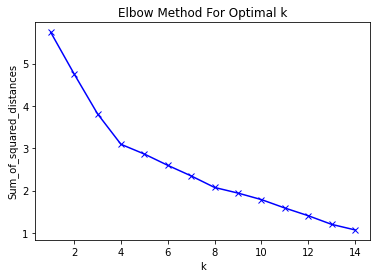

In [46]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k, random_state=0)
    km = km.fit(Waterloo_region_grouped.drop('Neighborhood', 1))
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [47]:
# set number of clusters
kclusters = 4

Waterloo_region_grouped_clustering = Waterloo_region_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Waterloo_region_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:len(Waterloo_region_grouped)] 

array([1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1])

In [48]:
df

,Unnamed: 0,Neighborhood,Borough,Province,Country,Post,address,location,latlong
0,0,Centreville Chicopee,Kitchener,Ontario,Canada,N2A,"Centreville Chicopee,Kitchener ,Ontario,Canada","Centreville-Chicopee Community Centre, Ice Rin...","(43.4285762, -80.4298143, 0.0)"
1,1,Grand River South,Kitchener,Ontario,Canada,N2A,"Grand River South,Kitchener ,Ontario,Canada","Grand River, Doon, Kitchener, Region of Waterl...","(43.4420287, -80.4030696, 0.0)"
2,2,Heritage Park,Kitchener,Ontario,Canada,N2A,"Heritage Park,Kitchener ,Ontario,Canada","Heritage Park, Kitchener, Region of Waterloo, ...","(43.46389545, -80.4473323, 0.0)"
3,3,Idlewood,Kitchener,Ontario,Canada,N2A,"Idlewood,Kitchener ,Ontario,Canada","Idlewood, Kitchener, Region of Waterloo, South...","(43.4481839, -80.4304161, 0.0)"
4,4,Stanley Park,Kitchener,Ontario,Canada,N2A,"Stanley Park,Kitchener ,Ontario,Canada","Stanley Park, Kitchener, Region of Waterloo, S...","(43.446187, -80.4456112, 0.0)"
5,5,Grand River North,Kitchener,Ontario,Canada,N2B,"Grand River North,Kitchener ,Ontario,Canada","Grand River, Doon, Kitchener, Region of Waterl...","(43.4420287, -80.4030696, 0.0)"
6,6,Rosemount,Kitchener,Ontario,Canada,N2B,"Rosemount,Kitchener ,Ontario,Canada","Rosemount, Kitchener, Region of Waterloo, Sout...","(43.4582875, -80.4612751, 0.0)"
7,7,Victoria North,Kitchener,Ontario,Canada,N2B,"Victoria North,Kitchener ,Ontario,Canada","RBC, Ontario Street North, Downtown, Kitchener...","(43.4515356, -80.4891511, 0.0)"
8,8,Alpine,Kitchener,Ontario,Canada,N2C,"Alpine,Kitchener ,Ontario,Canada","Kitchener, Region of Waterloo, Southwestern On...","(43.451291, -80.4927815, 0.0)"
9,9,Country Hills East,Kitchener,Ontario,Canada,N2C,"Country Hills East,Kitchener ,Ontario,Canada","Country Hills East, Kitchener, Region of Water...","(43.4169416, -80.463139, 0.0)"


In [49]:

# add clustering labels
try:
    neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
except: # for scenario where we are rerunning this and the column already exists
    neighborhoods_venues_sorted.drop(columns='Cluster Labels', inplace=True) 
    neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Waterloo_merged = df[['Neighborhood','Borough', 'latlong',]]



In [50]:
Waterloo_merged = Waterloo_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Waterloo_merged

,Neighborhood,Borough,latlong,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,Centreville Chicopee,Kitchener,"(43.4285762, -80.4298143, 0.0)",1.0,American Restaurant,Coffee Shop,Fast Food Restaurant,Sandwich Place,Bakery,Asian Restaurant,Food & Drink Shop,Furniture / Home Store,Grocery Store,Italian Restaurant,Liquor Store,Middle Eastern Restaurant,Pizza Place,Café,Diner,Skating Rink,Gastropub,Gym,Pet Store,Gas Station
1,Grand River South,Kitchener,"(43.4420287, -80.4030696, 0.0)",1.0,Gym,Hotpot Restaurant,Convenience Store,Soccer Field,Music Venue,Outdoor Supply Store,Furniture / Home Store,Seafood Restaurant,Garden,Design Studio,Pizza Place,Dessert Shop,Farm,Department Store,Diner,Cupcake Shop,Discount Store,Eastern European Restaurant,Electronics Store,Cosmetics Shop
2,Heritage Park,Kitchener,"(43.46389545, -80.4473323, 0.0)",1.0,Pizza Place,Coffee Shop,Café,Grocery Store,Restaurant,Eastern European Restaurant,Vegetarian / Vegan Restaurant,Pool,Concert Hall,Caribbean Restaurant,Chinese Restaurant,Pub,Pharmacy,Park,Movie Theater,Museum,Brewery,Middle Eastern Restaurant,Department Store,Juice Bar
3,Idlewood,Kitchener,"(43.4481839, -80.4304161, 0.0)",1.0,Beer Garden,Recreation Center,Volleyball Court,Paper / Office Supplies Store,Trail,Shoe Store,Yoga Studio,Diner,Farm,Falafel Restaurant,Electronics Store,Eastern European Restaurant,Discount Store,Design Studio,Dessert Shop,Fast Food Restaurant,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center
4,Stanley Park,Kitchener,"(43.446187, -80.4456112, 0.0)",1.0,Breakfast Spot,Café,Flower Shop,Falafel Restaurant,Pub,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Fish Market,Electronics Store,Cupcake Shop,Cosmetics Shop,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Convention Center,Eastern European Restaurant
5,Grand River North,Kitchener,"(43.4420287, -80.4030696, 0.0)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Rosemount,Kitchener,"(43.4582875, -80.4612751, 0.0)",1.0,Restaurant,Italian Restaurant,Liquor Store,Yoga Studio,Seafood Restaurant,Beer Bar,Bistro,Breakfast Spot,Café,Dessert Shop,Gastropub,Greek Restaurant,Grocery Store,Indian Restaurant,Pizza Place,American Restaurant,Supplement Shop,Falafel Restaurant,Comfort Food Restaurant,Comic Shop
7,Victoria North,Kitchener,"(43.4515356, -80.4891511, 0.0)",1.0,Café,Coffee Shop,Indian Restaurant,Burrito Place,Restaurant,Pub,Middle Eastern Restaurant,Ice Cream Shop,Hobby Shop,Burger Joint,Greek Restaurant,Frozen Yogurt Shop,Sandwich Place,French Restaurant,Chinese Restaurant,Gastropub,Hotel,Park,Music Venue,Bubble Tea Shop
8,Alpine,Kitchener,"(43.451291, -80.4927815, 0.0)",1.0,Grocery Store,Wings Joint,Warehouse Store,Smoothie Shop,Dessert Shop,Italian Restaurant,Eastern European Restaurant,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Diner,Discount Store,Fish Market,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center
9,Country Hills East,Kitchener,"(43.4169416, -80.463139, 0.0)",1.0,Coffee Shop,Portuguese Restaurant,Supplement Shop,Grocery Store,Gym,Gym / Fitness Center,Pizza Place,Sandwich Place,Café,Sports Bar,Greek Restaurant,Vietnamese Restaurant,Trail,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store


In [51]:
Waterloo_merged['Cluster Labels'].value_counts()

1.0    32
2.0     2
0.0     1
3.0     1
Name: Cluster Labels, dtype: int64

Writting a fucntion that sorts the venues into descending order

In [52]:
len(Waterloo_merged)

63

In [53]:
Waterloo_merged.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Waterloo_merged.csv')

In [54]:
Waterloo_merged = Waterloo_merged.dropna()
len(Waterloo_merged)

36

Saving merged file

In [55]:
Waterloo_merged.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Water.csv')


In [56]:
Waterloo_region_cleaned = pd.read_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Water.csv')
Waterloo_region_cleaned

,Unnamed: 0,Neighborhood,Borough,latlong,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue
0,0,Centreville Chicopee,Kitchener,"(43.4285762, -80.4298143, 0.0)",1.0,American Restaurant,Coffee Shop,Fast Food Restaurant,Sandwich Place,Bakery,Asian Restaurant,Food & Drink Shop,Furniture / Home Store,Grocery Store,Italian Restaurant,Liquor Store,Middle Eastern Restaurant,Pizza Place,Café,Diner,Skating Rink,Gastropub,Gym,Pet Store,Gas Station
1,1,Grand River South,Kitchener,"(43.4420287, -80.4030696, 0.0)",1.0,Gym,Hotpot Restaurant,Convenience Store,Soccer Field,Music Venue,Outdoor Supply Store,Furniture / Home Store,Seafood Restaurant,Garden,Design Studio,Pizza Place,Dessert Shop,Farm,Department Store,Diner,Cupcake Shop,Discount Store,Eastern European Restaurant,Electronics Store,Cosmetics Shop
2,2,Heritage Park,Kitchener,"(43.46389545, -80.4473323, 0.0)",1.0,Pizza Place,Coffee Shop,Café,Grocery Store,Restaurant,Eastern European Restaurant,Vegetarian / Vegan Restaurant,Pool,Concert Hall,Caribbean Restaurant,Chinese Restaurant,Pub,Pharmacy,Park,Movie Theater,Museum,Brewery,Middle Eastern Restaurant,Department Store,Juice Bar
3,3,Idlewood,Kitchener,"(43.4481839, -80.4304161, 0.0)",1.0,Beer Garden,Recreation Center,Volleyball Court,Paper / Office Supplies Store,Trail,Shoe Store,Yoga Studio,Diner,Farm,Falafel Restaurant,Electronics Store,Eastern European Restaurant,Discount Store,Design Studio,Dessert Shop,Fast Food Restaurant,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center
4,4,Stanley Park,Kitchener,"(43.446187, -80.4456112, 0.0)",1.0,Breakfast Spot,Café,Flower Shop,Falafel Restaurant,Pub,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Fish Market,Electronics Store,Cupcake Shop,Cosmetics Shop,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Convention Center,Eastern European Restaurant
5,6,Rosemount,Kitchener,"(43.4582875, -80.4612751, 0.0)",1.0,Restaurant,Italian Restaurant,Liquor Store,Yoga Studio,Seafood Restaurant,Beer Bar,Bistro,Breakfast Spot,Café,Dessert Shop,Gastropub,Greek Restaurant,Grocery Store,Indian Restaurant,Pizza Place,American Restaurant,Supplement Shop,Falafel Restaurant,Comfort Food Restaurant,Comic Shop
6,7,Victoria North,Kitchener,"(43.4515356, -80.4891511, 0.0)",1.0,Café,Coffee Shop,Indian Restaurant,Burrito Place,Restaurant,Pub,Middle Eastern Restaurant,Ice Cream Shop,Hobby Shop,Burger Joint,Greek Restaurant,Frozen Yogurt Shop,Sandwich Place,French Restaurant,Chinese Restaurant,Gastropub,Hotel,Park,Music Venue,Bubble Tea Shop
7,8,Alpine,Kitchener,"(43.451291, -80.4927815, 0.0)",1.0,Grocery Store,Wings Joint,Warehouse Store,Smoothie Shop,Dessert Shop,Italian Restaurant,Eastern European Restaurant,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Diner,Discount Store,Fish Market,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center
8,9,Country Hills East,Kitchener,"(43.4169416, -80.463139, 0.0)",1.0,Coffee Shop,Portuguese Restaurant,Supplement Shop,Grocery Store,Gym,Gym / Fitness Center,Pizza Place,Sandwich Place,Café,Sports Bar,Greek Restaurant,Vietnamese Restaurant,Trail,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store
9,10,Trillium Industrial Park,Kitchener,"(43.4058000, -80.4493000, 0.0)",1.0,Coffee Shop,Grocery Store,Bank,Pub,Sandwich Place,Café,Sporting Goods Shop,Steakhouse,Ice Cream Shop,Thrift / Vintage Store,Pet Store,Arts & Crafts Store,Gym,Baby Store,Gas Station,Diner,Falafel Restaurant,Electronics Store,Eastern European Restaura

In [57]:
Waterloo_region_cleaned['Cluster Labels'] = Waterloo_region_cleaned['Cluster Labels'].astype(int)

Splitting the latlong column and creating Two addtional columns lat and long

In [58]:
Waterloo_region_cleaned['latlong'] = Waterloo_region_cleaned['latlong'].str.strip('()')
Waterloo_region_cleaned['lat'], Waterloo_region_cleaned['long'], Waterloo_region_cleaned['0'] = Waterloo_region_cleaned['latlong'].str.split(',').str

Deleting the column that contains the 0.0 values from latlong and the two unnamed columns (indexes)

In [59]:
del Waterloo_region_cleaned['0']
del Waterloo_region_cleaned['Unnamed: 0']

In [60]:
Waterloo_region_cleaned

,Neighborhood,Borough,latlong,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue,lat,long
0,Centreville Chicopee,Kitchener,"43.4285762, -80.4298143, 0.0",1,American Restaurant,Coffee Shop,Fast Food Restaurant,Sandwich Place,Bakery,Asian Restaurant,Food & Drink Shop,Furniture / Home Store,Grocery Store,Italian Restaurant,Liquor Store,Middle Eastern Restaurant,Pizza Place,Café,Diner,Skating Rink,Gastropub,Gym,Pet Store,Gas Station,43.4285762,-80.4298143
1,Grand River South,Kitchener,"43.4420287, -80.4030696, 0.0",1,Gym,Hotpot Restaurant,Convenience Store,Soccer Field,Music Venue,Outdoor Supply Store,Furniture / Home Store,Seafood Restaurant,Garden,Design Studio,Pizza Place,Dessert Shop,Farm,Department Store,Diner,Cupcake Shop,Discount Store,Eastern European Restaurant,Electronics Store,Cosmetics Shop,43.4420287,-80.4030696
2,Heritage Park,Kitchener,"43.46389545, -80.4473323, 0.0",1,Pizza Place,Coffee Shop,Café,Grocery Store,Restaurant,Eastern European Restaurant,Vegetarian / Vegan Restaurant,Pool,Concert Hall,Caribbean Restaurant,Chinese Restaurant,Pub,Pharmacy,Park,Movie Theater,Museum,Brewery,Middle Eastern Restaurant,Department Store,Juice Bar,43.46389545,-80.4473323
3,Idlewood,Kitchener,"43.4481839, -80.4304161, 0.0",1,Beer Garden,Recreation Center,Volleyball Court,Paper / Office Supplies Store,Trail,Shoe Store,Yoga Studio,Diner,Farm,Falafel Restaurant,Electronics Store,Eastern European Restaurant,Discount Store,Design Studio,Dessert Shop,Fast Food Restaurant,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,43.4481839,-80.4304161
4,Stanley Park,Kitchener,"43.446187, -80.4456112, 0.0",1,Breakfast Spot,Café,Flower Shop,Falafel Restaurant,Pub,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Fish Market,Electronics Store,Cupcake Shop,Cosmetics Shop,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Convention Center,Eastern European Restaurant,43.446187,-80.4456112
5,Rosemount,Kitchener,"43.4582875, -80.4612751, 0.0",1,Restaurant,Italian Restaurant,Liquor Store,Yoga Studio,Seafood Restaurant,Beer Bar,Bistro,Breakfast Spot,Café,Dessert Shop,Gastropub,Greek Restaurant,Grocery Store,Indian Restaurant,Pizza Place,American Restaurant,Supplement Shop,Falafel Restaurant,Comfort Food Restaurant,Comic Shop,43.4582875,-80.4612751
6,Victoria North,Kitchener,"43.4515356, -80.4891511, 0.0",1,Café,Coffee Shop,Indian Restaurant,Burrito Place,Restaurant,Pub,Middle Eastern Restaurant,Ice Cream Shop,Hobby Shop,Burger Joint,Greek Restaurant,Frozen Yogurt Shop,Sandwich Place,French Restaurant,Chinese Restaurant,Gastropub,Hotel,Park,Music Venue,Bubble Tea Shop,43.4515356,-80.4891511
7,Alpine,Kitchener,"43.451291, -80.4927815, 0.0",1,Grocery Store,Wings Joint,Warehouse Store,Smoothie Shop,Dessert Shop,Italian Restaurant,Eastern European Restaurant,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,Diner,Discount Store,Fish Market,Design Studio,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,43.451291,-80.4927815
8,Country Hills East,Kitchener,"43.4169416, -80.463139, 0.0",1,Coffee Shop,Portuguese Restaurant,Supplement Shop,Grocery Store,Gym,Gym / Fitness Center,Pizza Place,Sandwich Place,Café,Sports Bar,Greek Restaurant,Vietnamese Restaurant,Trail,Eastern European Restaurant,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Farm,Falafel Restaurant,Electronics Store,43.4169416,-80.463139
9,Trillium Industrial Park,Kitchener,"43.4058000, -80.4493000, 0.0",1,Coffee Shop,Grocery Store,Bank,Pub,Sandwich Place,Café,Sporting Goods Shop,Steakhouse,Ice Cream Shop,Thrift

In [61]:
Waterloo_region_cleaned.to_csv(r'C:\Users\alecl\Desktop\Certificates\Coursera\Capstone\Waterloo_cleanedv2.csv')


In [67]:
locations = Waterloo_region_cleaned[['lat', 'long']]
locationlist = locations.values.tolist()
locationlist

[['43.4285762', ' -80.4298143'],
 ['43.4420287', ' -80.4030696'],
 ['43.46389545', ' -80.4473323'],
 ['43.4481839', ' -80.4304161'],
 ['43.446187', ' -80.4456112'],
 ['43.4582875', ' -80.4612751'],
 ['43.4515356', ' -80.4891511'],
 ['43.451291', ' -80.4927815'],
 ['43.4169416', ' -80.463139'],
 ['43.4058000', '  -80.4493000'],
 ['43.4246395', ' -80.4600829'],
 ['43.4140031', ' -80.4730164'],
 ['43.4098067', ' -80.4881723'],
 ['43.4199304', ' -80.4988723'],
 ['43.43555795', ' -80.5036835'],
 ['43.4477585', ' -80.5084311'],
 ['43.4550000 ', ' -80.5091000'],
 ['43.4595', ' -80.5570'],
 ['43.4650327', ' -80.5551265'],
 ['43.469553', ' -80.5793528'],
 ['43.4396342', ' -80.520977'],
 ['43.4825695', ' -80.4826662'],
 ['43.4279', ' -80.5133'],
 ['43.4207395', ' -80.5247597'],
 ['43.3904259', ' -80.4245585'],
 ['43.3952439', ' -80.4413837'],
 ['43.4076', ' -80.3854'],
 ['43.3945331', ' -80.4595344'],
 ['43.3713', ' -80.4938'],
 ['43.4147508', ' -80.5532819'],
 ['43.469553', ' -80.5793528'],
 ['

## Making the cluster map

In [66]:
# create map of Waterloo region using latitude and longitude values
map_clusters = folium.Map(location=[Waterloo_region_lat, Waterloo_region_long], zoom_start=12)
markers_colors = []
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.spring(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Waterloo_region_cleaned['lat'], Waterloo_region_cleaned['long'], Waterloo_region_cleaned['Borough'], Waterloo_region_cleaned['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters


Creating a plot to visualize clusters

In [88]:
Waterloo_region_cleaned

,Unnamed: 0.1,Neighborhood,Borough,Province,Country,Post,address,location,latlong,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue,lat,long
0,0,Centreville Chicopee,Kitchener,Ontario,Canada,N2A,"Centreville Chicopee,Kitchener ,Ontario,Canada","Centreville-Chicopee Community Centre, Ice Rin...","43.4285762, -80.4298143, 0.0",1.0,American Restaurant,Coffee Shop,Fast Food Restaurant,Sandwich Place,Bakery,Asian Restaurant,Food & Drink Shop,Furniture / Home Store,Grocery Store,Italian Restaurant,Liquor Store,Middle Eastern Restaurant,Pizza Place,Café,Diner,Skating Rink,Gastropub,Gym,Pet Store,Gas Station,43.4285762,-80.4298143
1,1,Grand River South,Kitchener,Ontario,Canada,N2A,"Grand River South,Kitchener ,Ontario,Canada","Grand River, Doon, Kitchener, Region of Waterl...","43.4420287, -80.4030696, 0.0",1.0,Gym,Hotpot Restaurant,Convenience Store,Soccer Field,Music Venue,Outdoor Supply Store,Furniture / Home Store,Seafood Restaurant,Garden,Design Studio,Pizza Place,Dessert Shop,Farm,Department Store,Diner,Cupcake Shop,Discount Store,Eastern European Restaurant,Electronics Store,Cosmetics Shop,43.4420287,-80.4030696
2,2,Heritage Park,Kitchener,Ontario,Canada,N2A,"Heritage Park,Kitchener ,Ontario,Canada","Heritage Park, Kitchener, Region of Waterloo, ...","43.46389545, -80.4473323, 0.0",1.0,Pizza Place,Coffee Shop,Café,Grocery Store,Restaurant,Eastern European Restaurant,Vegetarian / Vegan Restaurant,Pool,Concert Hall,Caribbean Restaurant,Chinese Restaurant,Pub,Pharmacy,Park,Movie Theater,Museum,Brewery,Middle Eastern Restaurant,Department Store,Juice Bar,43.46389545,-80.4473323
3,3,Idlewood,Kitchener,Ontario,Canada,N2A,"Idlewood,Kitchener ,Ontario,Canada","Idlewood, Kitchener, Region of Waterloo, South...","43.4481839, -80.4304161, 0.0",1.0,Beer Garden,Recreation Center,Volleyball Court,Paper / Office Supplies Store,Trail,Shoe Store,Yoga Studio,Diner,Farm,Falafel Restaurant,Electronics Store,Eastern European Restaurant,Discount Store,Design Studio,Dessert Shop,Fast Food Restaurant,Department Store,Cupcake Shop,Cosmetics Shop,Convention Center,43.4481839,-80.4304161
4,4,Stanley Park,Kitchener,Ontario,Canada,N2A,"Stanley Park,Kitchener ,Ontario,Canada","Stanley Park, Kitchener, Region of Waterloo, S...","43.446187, -80.4456112, 0.0",1.0,Breakfast Spot,Café,Flower Shop,Falafel Restaurant,Pub,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Fish Market,Electronics Store,Cupcake Shop,Cosmetics Shop,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Convention Center,Eastern European Restaurant,43.446187,-80.4456112
5,5,Grand River North,Kitchener,Ontario,Canada,N2B,"Grand River North,Kitchener ,Ontario,Canada","Grand River, Doon, Kitchener, Region of Waterl...","43.4420287, -80.4030696, 0.0",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.4420287,-80.4030696
6,6,Rosemount,Kitchener,Ontario,Canada,N2B,"Rosemount,Kitchener ,Ontario,Canada","Rosemount, Kitchener, Region of Waterloo, Sout...","43.4582875, -80.4612751, 0.0",1.0,Restaurant,Italian Restaurant,Liquor Store,Yoga Studio,Seafood Restaurant,Beer Bar,Bistro,Breakfast Spot,Café,Dessert Shop,Gastropub,Greek Restaurant,Grocery Store,Indian Restaurant,Pizza Place,American Restaurant,Supplement Shop,Falafel Restaurant,Comfort Food Restaurant,Comic Shop,43.4582875,-80.4612751
7,7,Victoria North,Kitchener,Ontario,Canada,N2B,"Victoria North,Kitchener ,Ontario,Canada","RBC, Ontario Street North, Downtown, Kitchener...","43.4515356, -80.4891511, 0.0",1.0,Café,Coffee Shop,Indian Restaurant,Burrito Place,Restaurant,Pub,Middl

In [89]:
Waterloo_region_cleaned.groupby(['Cluster Labels']).count()

,Unnamed: 0.1,Neighborhood,Borough,Province,Country,Post,address,location,latlong,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue,16th Most Common Venue,17th Most Common Venue,18th Most Common Venue,19th Most Common Venue,20th Most Common Venue,lat,long
Cluster Labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1.0,32,32,32,32,32,32,32,24,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
2.0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
3.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [90]:
Waterloo_region_grouped.insert(0, 'Cluster Labels', kmeans.labels_)

In [91]:
character = Waterloo_region_grouped.groupby('Cluster Labels').mean()

In [92]:
character.head()

,American Restaurant,Antique Shop,Arcade,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bistro,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Candy Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Convention Center,Cosmetics Shop,Cupcake Shop,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Electronics Store,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food & Drink Shop,Food Court,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,German Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,History Museum,Hobby Shop,Hockey Arena,Hotel,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Lake,Latin American Restaurant,Liquor Store,Market,Mexican Restaurant,Middle Eastern Restaurant,Movie Theater,Multiplex,Museum,Music Venue,Other Great Outdoors,Outdoor Supply Store,Paper / Office Supplies Store,Park,Pet Store,Pharmacy,Pizza Place,Playground,Pool,Pool Hall,Portuguese Restaurant,Pub,Recreation Center,Rental Car Location,Resort,Restaurant,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skating Rink,Ski Area,Smoothie Shop,Soccer Field,Soup Place,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Thai Restaurant,Theater,Theme Park,Thrift / Vintage Store,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Yoga Studio
Cluster Labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.005498,0.000978,0.000323,0.002888,0.004424,0.00224,0.002016,0.000645,0.004629,0.026135,0.005994,0.001613,0.012097,0.013638,0.001344,0.002258,0.003255,0.000645,0.013595,0.0016,0.000768,0.000323,0.008306,0.001536,0.000645,0.023856,0.001654,0.000645,0.008321,0.000323,0.003242,0.000633,0.071817,0.001792,0.000323,0.000827,0.000645,0.007502,0.000827,0.001977,0.000978,0.008685,0.002933,0.007048,0.012398,0.012696,0.00129,0.002664,0.00

In [93]:
char_t = character.T

In [94]:
char_t

Cluster Labels,0,1,2,3
American Restaurant,0.0,0.005498,0.00,0.0
Antique Shop,0.0,0.000978,0.00,0.0
Arcade,0.0,0.000323,0.00,0.0
Arts & Crafts Store,0.0,0.002888,0.00,0.0
Asian Restaurant,0.0,0.004424,0.00,0.0
BBQ Joint,0.0,0.002240,0.00,0.0
Baby Store,0.0,0.002016,0.00,0.0
Bagel Shop,0.0,0.000645,0.00,0.0
Bakery,0.0,0.004629,0.00,0.0
Bank,1.0,0.026135,0.00,0.0


C:\Users\alecl\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1182: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticklabels)


<AxesSubplot:>

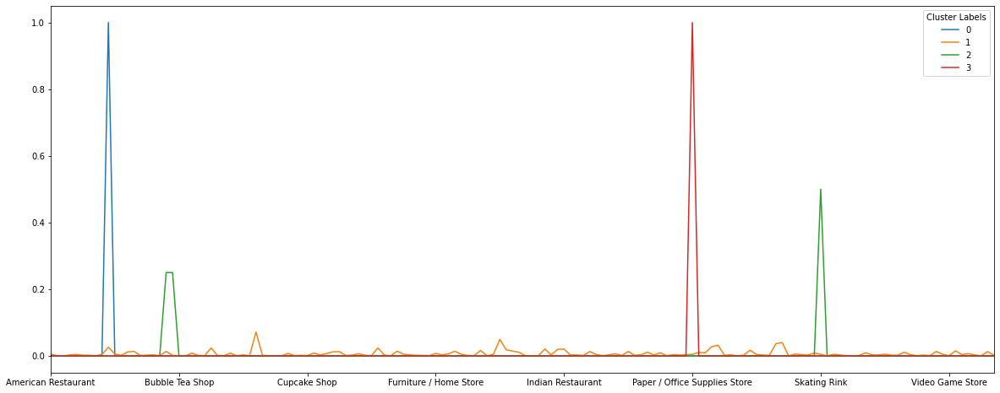

In [97]:
character.T.plot(kind = 'line', figsize=(20,8))

Determining the significant values for each cluster

In [19]:
character[character > 0.01]

NameError: name 'character' is not defined

Finding out the highest values for each cluster

In [56]:
char_t.columns= ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']
char_t

,Cluster 0,Cluster 1,Cluster 2,Cluster 3
American Restaurant,0.0,0.005498,0.00,0.0
Antique Shop,0.0,0.000978,0.00,0.0
Arcade,0.0,0.000323,0.00,0.0
Arts & Crafts Store,0.0,0.002888,0.00,0.0
Asian Restaurant,0.0,0.004424,0.00,0.0
BBQ Joint,0.0,0.002240,0.00,0.0
Baby Store,0.0,0.002016,0.00,0.0
Bagel Shop,0.0,0.000645,0.00,0.0
Bakery,0.0,0.004629,0.00,0.0
Bank,1.0,0.026135,0.00,0.0


In [57]:
clust0_top = char_t['Cluster 0'].sort_values(ascending=False).head(10)
clust0_top

Bank                           1.0
Yoga Studio                    0.0
Fish Market                    0.0
Fish & Chips Shop              0.0
Fast Food Restaurant           0.0
Farmers Market                 0.0
Farm                           0.0
Falafel Restaurant             0.0
Electronics Store              0.0
Eastern European Restaurant    0.0
Name: Cluster 0, dtype: float64

In [58]:
clust1_top = char_t['Cluster 1'].sort_values(ascending=False).head(10)
clust1_top

Coffee Shop             0.071817
Grocery Store           0.049662
Sandwich Place          0.040241
Restaurant              0.036553
Pizza Place             0.032019
Pharmacy                0.027452
Bank                    0.026135
Fast Food Restaurant    0.023931
Café                    0.023856
Hotel                   0.020698
Name: Cluster 1, dtype: float64

In [59]:
clust2_top = char_t['Cluster 2'].sort_values(ascending=False).head(10)
clust2_top

Skating Rink         0.50
Breakfast Spot       0.25
Brewery              0.25
Cupcake Shop         0.00
Department Store     0.00
Design Studio        0.00
Dessert Shop         0.00
Diner                0.00
Discount Store       0.00
Convenience Store    0.00
Name: Cluster 2, dtype: float64

In [60]:
clust3_top = char_t['Cluster 3'].sort_values(ascending=False).head(10)
clust3_top

Paper / Office Supplies Store    1.0
Yoga Studio                      0.0
Fish Market                      0.0
Fast Food Restaurant             0.0
Farmers Market                   0.0
Farm                             0.0
Falafel Restaurant               0.0
Electronics Store                0.0
Eastern European Restaurant      0.0
Discount Store                   0.0
Name: Cluster 3, dtype: float64

In [61]:
cl_all = pd.DataFrame(clust1_top).reset_index()
cl_all = cl_all.merge(pd.DataFrame(clust0_top).reset_index(), how='outer', on='index')
cl_all = cl_all.merge(pd.DataFrame(clust2_top).reset_index(), how='outer', on='index')
cl_all = cl_all.merge(pd.DataFrame(clust3_top).reset_index(), how='outer', on='index')
cl_all.set_index('index', inplace=True)
cl_all

,Cluster 1,Cluster 0,Cluster 2,Cluster 3
index,,,,
Coffee Shop,0.071817,NaN,NaN,NaN
Grocery Store,0.049662,NaN,NaN,NaN
Sandwich Place,0.040241,NaN,NaN,NaN
Restaurant,0.036553,NaN,NaN,NaN
Pizza Place,0.032019,NaN,NaN,NaN
Pharmacy,0.027452,NaN,NaN,NaN
Bank,0.026135,1.0,NaN,NaN
Fast Food Restaurant,0.023931,0.0,NaN,0.0
Café,0.023856,NaN,NaN,NaN


# Results 

In this project we have explored the the top venues and locations of each venue in the waWaterloo Region. Using clustering based on venues within walking distance, defined as 1000m radius we have clustered the venues into four groups.

Comparing the three largest clusters (clusters 2, 3 and 1 in descending order) we note the following:

The secoiond and third lasrgest clusteres only conatin approxiamtly 2 venues and the biggest clusters caontain the majority of venues located in the biggest neighborhoods. Cluster 1 contains all of the venues like shopping malls, offee shops and cafes.To be more specific about the type of each area beyond these shared features is difficult but we note a few differences using the top ten venue types for each cluster:
Cluster 1 (label 1) has the "core" venue types one might except, and has many types of restaurants and grocery stores.
Cluster 2 (label 2) has more skating rinks and breakfast spots compared to other clusters.
Cluster 3 (label 3) shows local restaurants and some fast food restauranmts. However very few.
Cluster 0 (label 0) Conatins venues like farmers markets farm equipment.

# Discussion 
Based on the results we have identified three types of areas unique venues appear. As assumbed at the begining of this experiemtn, the location of establishing a business will limited to more populuar neighborhoods, specifically those located at the city core. This assumption would need to be validated with data obtained from the waterloo region. The metrics from this experiment proved that areas of densily populated regions contain shoppin malls, cafes and restaurants, whereas the outskirts, containing lower poplattion densioty, local restaurants, schools and skating arenas are established. Other potential metrics to measure the viability of establishing a business wouild be establishmen and maintenace costs e.g: how much would property tax be in a region. Other metrics, potentially more difficult to interpret, would be growth rate of each region and expansion trends.

In theory, using these results, a clothing brand could characterise other areas where they might be considering opening a business. However a good starting point would be to find means within therebudget, but will currently have significant foot traffic. One thing noted during the exploration phase we  created a heat mapo with was a clear indicator of foot trafic density. In further work it would be idea if we could create a time lapse and see the growth rate over time to better understand the trends of growth within the waterloo region.

# Conclusion 
The aim of this project was to explore the following question:

Where would be the best location to build a business as a clothing brand within the waterloo region? What are the most popular neighborhoods and what venues are stituated within? Alternatively, is there a particular type or number of types of neighbourhoods in which a clothing brand should be established.

We have been able to show that the most popular venues fall into three main types of neighbourhood based on the types of venues in those neighbourhoods. This analysis might allow businesses to understand what is in the region and what kind of impact that may or may not have on their business.

Key things to explore further would be how to imnplemnet a time series analysis to determine the trends of city expansion. What are the most succesful brands nearby. Finally what kind of services are nearby, for example commuter train stations and key roads.